### speed of sound scaling

Method 1) extrapolate the v scaling of lineair fit of two subsequent points

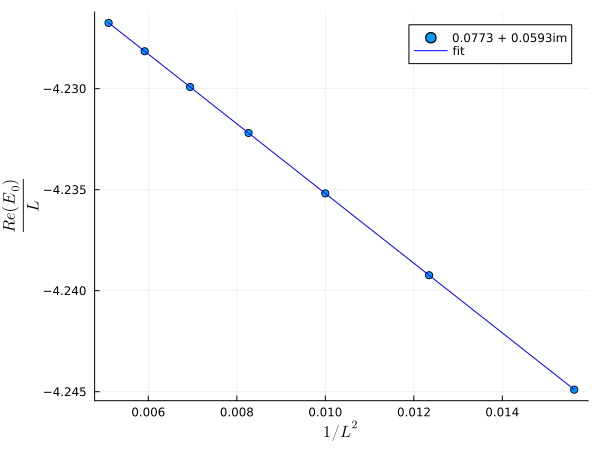

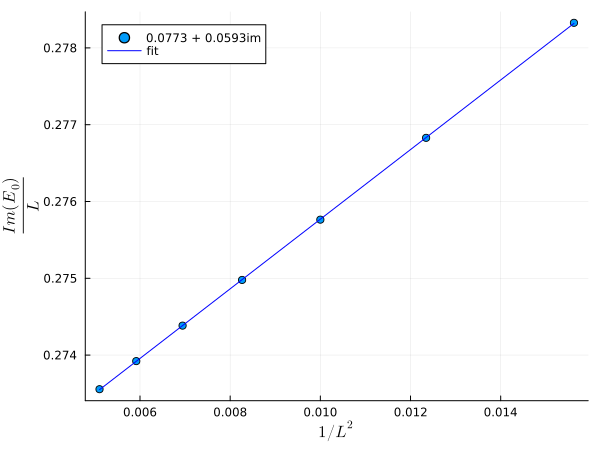

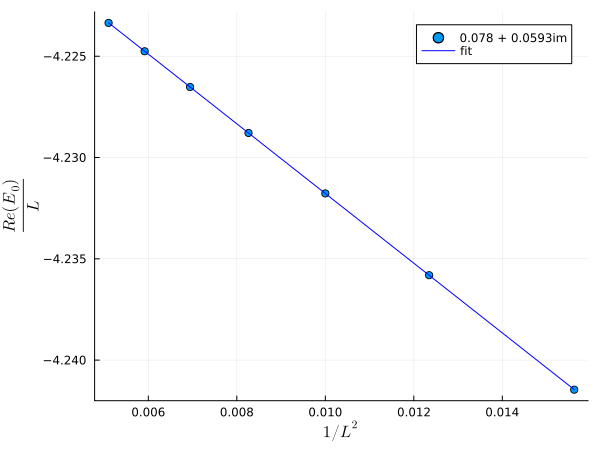

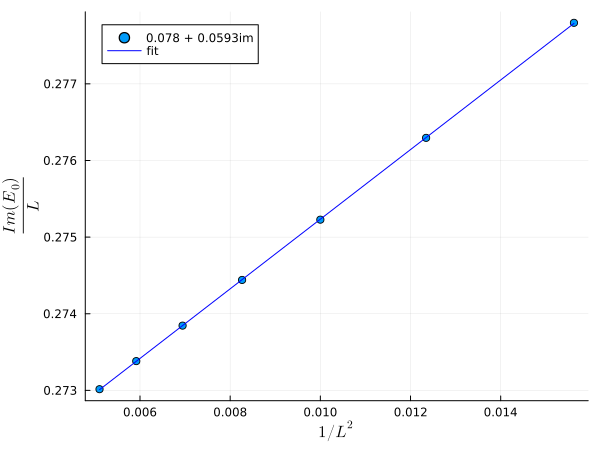

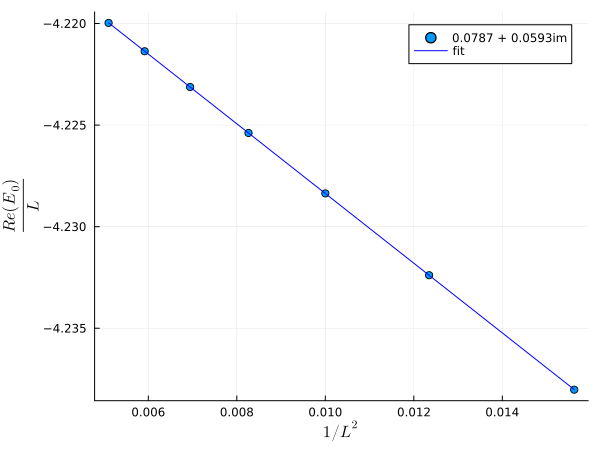

...

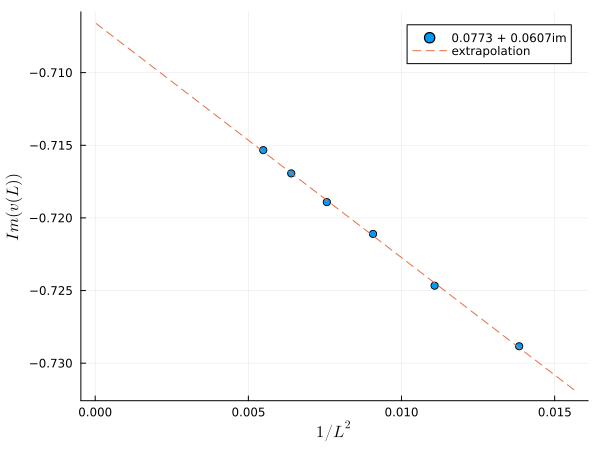

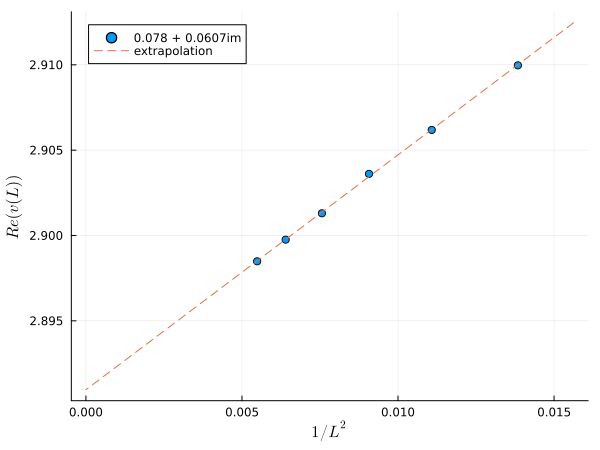

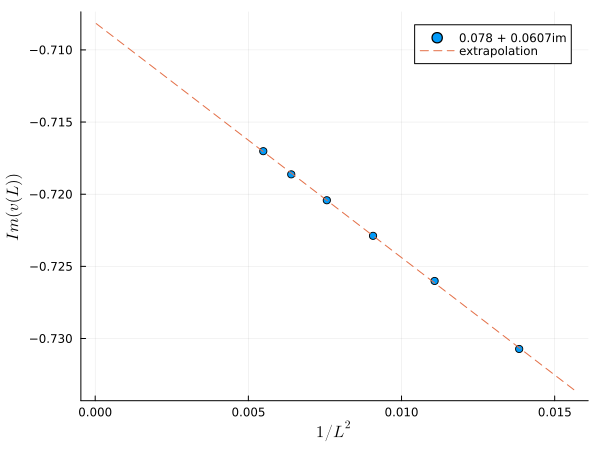

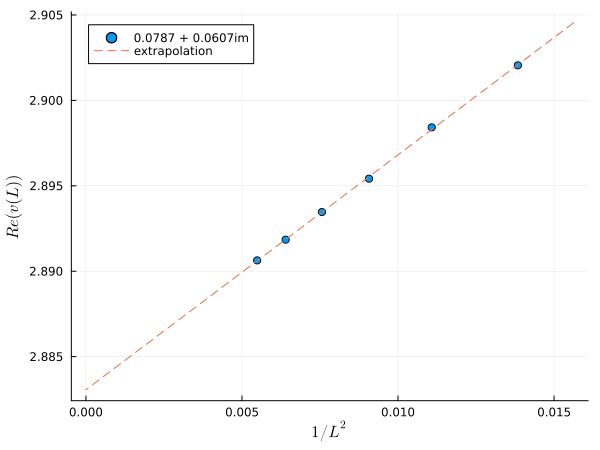

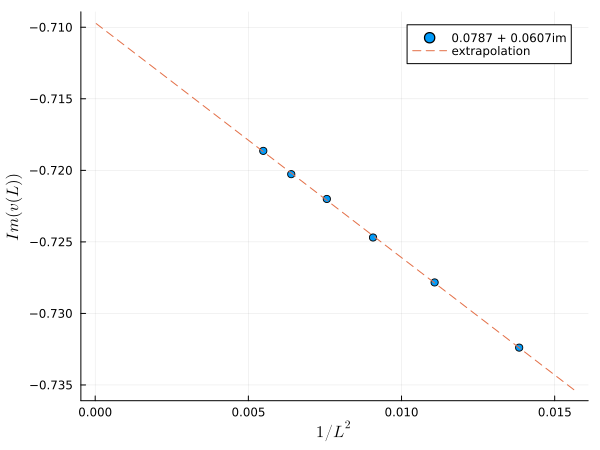

In [40]:
using JLD2, Plots, CurveFit
L_list = 8:14
lambda_list = [0.0773 + 0.0593im, 0.078 + 0.0593im, 0.0787 + 0.0593im, 0.0773 + 0.06im, 0.078 + 0.06im, 0.0787 + 0.06im, 0.0773 + 0.0607im, 0.078 + 0.0607im, 0.0787 + 0.0607im]
Op_label  = ["I","σ","ϵ","L-1ϵ"]
data = load("D500results.jld2")
cth = 1.13754733664723 - 0.0210687419403234im
Δ_list = zeros(ComplexF64,length(L_list),length(lambda_list),3)
E0_list = zeros(ComplexF64,length(L_list),length(lambda_list))
for (i,L) in enumerate(L_list)
    dataσ = load("sigma_analysis/sigma_Energy_$(L)_80.jld2")
    E0 = dataσ["E0"]
    Eσ = dataσ["Eσ"]
    E0_list[i,:] = E0
    Δ_list[i,:,1] = Eσ - E0
end
using LaTeXStrings
for (ind,lambda) in enumerate(lambda_list)
    ϵ0 = E0_list[:,ind]./L_list
    e = plot(xlabel=L"1/L^2",ylabel=L"\frac{Re(E_0)}{L}",size=(600,450))
    scatter!(1.0./L_list.^2,real(ϵ0),label="$lambda")
    fit = linear_fit(1.0./L_list[1:end].^2,ϵ0[1:end])
    plot!(1.0./L_list.^2,real(fit[1].+fit[2]./L_list.^2),color = "blue",label = "fit")
    display(e)


    e = plot(xlabel=L"1/L^2",ylabel=L"\frac{Im(E_0)}{L}",size=(600,450))
    scatter!(1.0./L_list.^2,imag(ϵ0),label="$lambda")
    fit = linear_fit(1.0./L_list[1:end].^2,ϵ0[1:end])
    plot!(1.0./L_list.^2,imag(fit[1].+fit[2]./L_list.^2),color = "blue",label = "fit")
    display(e)
end
for (ind,lambda) in enumerate(lambda_list)
    ϵ0 = E0_list[:,ind]./L_list
    v_list = []
    for i=1:length(L_list)-1
        ini = i
        fit = linear_fit(1.0./L_list[ini:ini+1].^2, ϵ0[ini:ini+1])
        v = -6*fit[2]/π/cth
        push!(v_list,v)
    end
    Leff = 0.5.+L_list[1:end-1]
    e = plot(xlabel=L"1/L^2",ylabel=L"Re(v(L))",size=(600,450))
    scatter!(1.0./Leff.^2,real(v_list),label="$lambda")
    fit = linear_fit(1.0./Leff[1:end].^2,v_list[1:end])
        x = 8:0.1:1000
    plot!(1.0./x.^2,real(fit[1].+fit[2]./x.^2),linestyle = :dash,label ="extrapolation")
    display(e)
    e = plot(xlabel=L"1/L^2",ylabel=L"Im(v(L))",size=(600,450))
    scatter!(1.0./Leff.^2,imag(v_list),label="$lambda")
    fit = linear_fit(1.0./Leff[1:end].^2,v_list[1:end])
    plot!(1.0./x.^2,imag(fit[1].+fit[2]./x.^2),linestyle = :dash,label ="extrapolation")
    display(e)
end